# Artificial Neural Network (Feed-Forward) for Classification and Inspection of SDSS Dataset with Stars, Galaxies, and Quasars

## Importing the libraries

In [2]:
import numpy as np
from numpy import ones
import pandas as pd
from keras.models import Sequential
from keras.layers import Dense
from keras.wrappers.scikit_learn import KerasClassifier
from keras.utils import np_utils
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

In [3]:
tf.__version__

'2.7.0'

## Data preprocessing and cleaning (cleansing)

### Importing the dataset 

In [4]:
dataframe = pd.read_csv('DR16_Skyserver_cleaned.csv')
dataset = dataframe.values
X = dataset[:,0:8].astype(float)
Y = dataset[:,8]

## Pairplots of dataset showing relationships

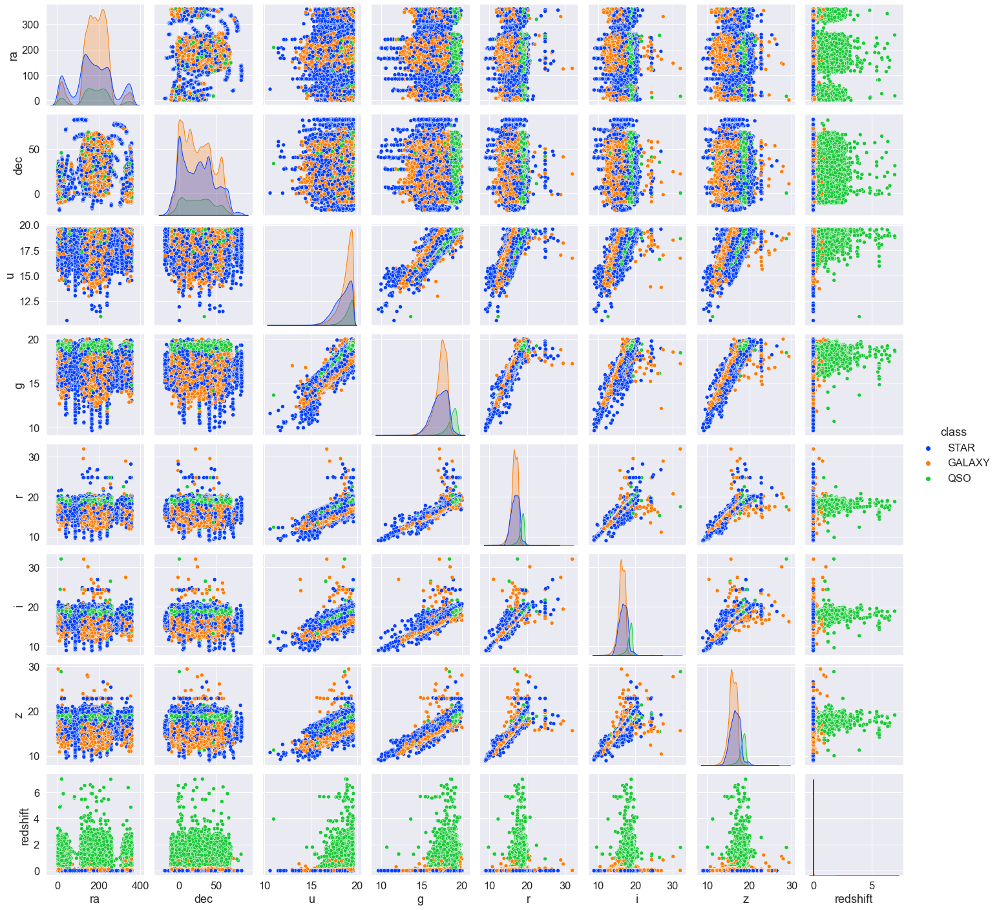

In [34]:
sns.set(font_scale=1.5)
sns.set_palette("bright")
sns.pairplot(dataframe, hue='class')
plt.show()

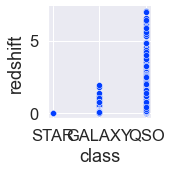

In [35]:
sns.pairplot(dataframe, x_vars=['class'], y_vars=['redshift'])


## Dataset analysis with 3D Scatter Plot - adjust the z to different filter curves

In [36]:
import plotly.express as px
fig = px.scatter_3d(dataframe, x='class', y='redshift', z='z',
              color='class')
fig.show()

## One hot encode class variables as integers

In [5]:
encoder = LabelEncoder()
encoder.fit(Y)
encoded_Y = encoder.transform(Y)
# convert integers to dummy variables with one hot encoding
dummy_y = np_utils.to_categorical(encoded_Y)

In [6]:
print(X)

[[ 4.73725449e+01  8.20620553e-01  1.86925400e+01 ...  1.63466200e+01
   1.61763900e+01  1.14654000e-04]
 [ 1.16303083e+02  4.24559804e+01  1.84763300e+01 ...  1.73278000e+01
   1.73711400e+01 -9.28000000e-05]
 [ 1.72756623e+02 -8.78569788e+00  1.64771400e+01 ...  1.57220700e+01
   1.58247100e+01  1.64581000e-04]
 ...
 [ 2.05426531e+02  3.84990534e+01  1.75069000e+01 ...  1.50446900e+01
   1.52866800e+01  4.58666300e-03]
 [ 3.37135144e+02 -9.63596714e+00  1.93394600e+01 ...  1.58674500e+01
   1.55155600e+01  8.45376500e-02]
 [ 3.74401880e+01  2.54008880e+01  1.81176900e+01 ...  1.60758200e+01
   1.59470100e+01 -8.46000000e-05]]


In [7]:
print(encoded_Y)

[2 2 2 ... 0 0 2]


In [8]:
print(dataset)

[[47.3725449 0.820620553 18.69254 ... 16.17639 0.000114654 'STAR']
 [116.3030825 42.4559804 18.47633 ... 17.37114 -9.28e-05 'STAR']
 [172.7566228 -8.785697882 16.47714 ... 15.82471 0.000164581 'STAR']
 ...
 [205.4265309 38.4990534 17.5069 ... 15.28668 0.004586663 'GALAXY']
 [337.1351436 -9.635967141 19.33946 ... 15.51556 0.08453765 'GALAXY']
 [37.44018804 25.40088802 18.11769 ... 15.94701 -8.46e-05 'STAR']]


## Filling in missing data with impute

In [9]:
imputer = SimpleImputer(missing_values=np.nan, strategy='mean')
imputer.fit(X[:, 2:8])
X[:, 2:8] = imputer.transform(X[:, 2:8])

## Splitting the dataset into training and test

In [10]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, dummy_y, test_size=0.2, random_state=0)

## Feature Scaling - observations fit a Gaussian distribution (bell curve) with a well behaved mean and standard deviation

In [11]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [12]:
print(X_test)

[[ 0.37610712  0.135311    0.13548879 ...  0.04557457  0.01315484
  -0.26894108]
 [ 0.45427222  0.25849729 -0.68956538 ... -0.71642314 -0.77423636
  -0.23175848]
 [ 2.22935501 -0.84339408  0.95108779 ... -0.31708514 -0.48659515
  -0.24541058]
 ...
 [-0.25340046  0.03890391  0.54915868 ...  1.35381387  1.23247211
   5.68691556]
 [ 0.25072306  1.50031606  1.07494336 ...  1.01213448  1.04190502
  -0.38934196]
 [ 0.10555731 -1.31813463  0.15895831 ...  0.04183222  0.02353168
  -0.23973949]]


## Define baseline model and create the ANN - adding input and hidden layers

In [13]:
model = tf.keras.models.Sequential()   
model.add(Dense(8, input_dim=8, activation='selu'))
model.add(Dense(3, activation='softmax'))


## Compiling the ANN - finding the minimum or maximum of a function

In [21]:
model.compile(loss='categorical_crossentropy', optimizer='Nadam', metrics=['accuracy'])


## Training the ANN on the Training set

In [28]:
 model.fit(X_train, Y_train, batch_size = 32, epochs = 100)

Epoch 1/100
2500/2500 [==============================] - 2s 876us/step - loss: 0.0542 - accuracy: 0.9865
Epoch 2/100
2500/2500 [==============================] - 2s 843us/step - loss: 0.0540 - accuracy: 0.9867
Epoch 3/100
2500/2500 [==============================] - 2s 945us/step - loss: 0.0543 - accuracy: 0.9866
Epoch 4/100
2500/2500 [==============================] - 2s 870us/step - loss: 0.0538 - accuracy: 0.9866
Epoch 5/100
2500/2500 [==============================] - 2s 837us/step - loss: 0.0538 - accuracy: 0.9867
Epoch 6/100
2500/2500 [==============================] - 2s 830us/step - loss: 0.0537 - accuracy: 0.9864
Epoch 7/100
2500/2500 [==============================] - 2s 843us/step - loss: 0.0536 - accuracy: 0.9865
Epoch 8/100
2500/2500 [==============================] - 2s 821us/step - loss: 0.0536 - accuracy: 0.9868
Epoch 9/100
2500/2500 [==============================] - 2s 843us/step - loss: 0.0535 - accuracy: 0.9865
Epoch 10/100
2500/2500 [==============================]

2500/2500 [==============================] - 2s 830us/step - loss: 0.0504 - accuracy: 0.9878
Epoch 79/100
2500/2500 [==============================] - 2s 799us/step - loss: 0.0503 - accuracy: 0.9877
Epoch 80/100
2500/2500 [==============================] - 2s 847us/step - loss: 0.0502 - accuracy: 0.9880
Epoch 81/100
2500/2500 [==============================] - 2s 852us/step - loss: 0.0500 - accuracy: 0.9878
Epoch 82/100
2500/2500 [==============================] - 2s 799us/step - loss: 0.0498 - accuracy: 0.9880
Epoch 83/100
2500/2500 [==============================] - 2s 802us/step - loss: 0.0499 - accuracy: 0.9880
Epoch 84/100
2500/2500 [==============================] - 2s 811us/step - loss: 0.0498 - accuracy: 0.9881
Epoch 85/100
2500/2500 [==============================] - 2s 825us/step - loss: 0.0501 - accuracy: 0.9879
Epoch 86/100
2500/2500 [==============================] - 2s 837us/step - loss: 0.0496 - accuracy: 0.9880
Epoch 87/100
2500/2500 [==============================] - 2

## Making predictions

In [29]:
predict_x=model.predict(X_test) 
classes_x=np.argmax(predict_x,axis=-1)
print(X_test)


[[ 0.37610712  0.135311    0.13548879 ...  0.04557457  0.01315484
  -0.26894108]
 [ 0.45427222  0.25849729 -0.68956538 ... -0.71642314 -0.77423636
  -0.23175848]
 [ 2.22935501 -0.84339408  0.95108779 ... -0.31708514 -0.48659515
  -0.24541058]
 ...
 [-0.25340046  0.03890391  0.54915868 ...  1.35381387  1.23247211
   5.68691556]
 [ 0.25072306  1.50031606  1.07494336 ...  1.01213448  1.04190502
  -0.38934196]
 [ 0.10555731 -1.31813463  0.15895831 ...  0.04183222  0.02353168
  -0.23973949]]


In [30]:
print(classes_x)

[0 0 0 ... 1 2 0]


## Test the accuracy and confusion_matrix

In [31]:
score, acc = model.evaluate(X_test, Y_test,verbose=2, batch_size= 256)
print('test accuracy:', acc)

79/79 - 0s - loss: 0.0521 - accuracy: 0.9877 - 69ms/epoch - 874us/step
test accuracy: 0.9877499938011169


In [32]:
yhat_classes = X_test[:, 0]

In [33]:
from sklearn.metrics import confusion_matrix
y_pred=model.predict(X_test) 
y_pred=np.argmax(y_pred, axis=1)
y_test=np.argmax(Y_test, axis=1)
cm = confusion_matrix(y_test, y_pred)
print(cm)

[[10139    38   113]
 [   84  2054     2]
 [    8     0  7562]]
